## Embedding viz

### Imports

In [23]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [24]:
from env.imports import *

In [25]:
import importlib
import data

import models
import sim.sim
import sim.sim_utils
from sim.sim_utils import bytes2human, print_system_usage
from sim.sim import Simulation
from sim.sim_run import single_sim_run

importlib.reload(sim.sim)
importlib.reload(sim.sim_run)
importlib.reload(models.train_val)
importlib.reload(data.data_utils)


<module 'data.data_utils' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/data/data_utils.py'>

#### Check job specs

In [26]:
print_system_usage()

total = psutil.disk_usage('/').total
print(bytes2human(total))

CPU Usage: 3.5%
RAM Usage: 3.0%
Available RAM: 1.4T
Total RAM: 1.5T
52.4G


In [27]:
print(os.environ.get("CUDA_VISIBLE_DEVICES"))

# Check available GPUs
print(f"Available GPUs: {torch.cuda.device_count()}")

for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)} - Memory Allocated: {torch.cuda.memory_allocated(i)/1024**3:.2f} GB")


None
Available GPUs: 1
GPU 0: NVIDIA H100 80GB HBM3 - Memory Allocated: 0.12 GB


### Setup

In [28]:
from data.data_load import load_transcriptome, load_connectome, load_coords, load_network_labels
from data.data_viz import plot_connectome, plot_transcriptome
from data.data_utils import expand_X_symmetric, expand_Y_symmetric
from data.data_utils import RegionPairDataset
from torch.utils.data import Subset

from data.data_viz import plot_umap_embeddings_w_fc

Loading data...
Number of components for 95% variance PCA: 27


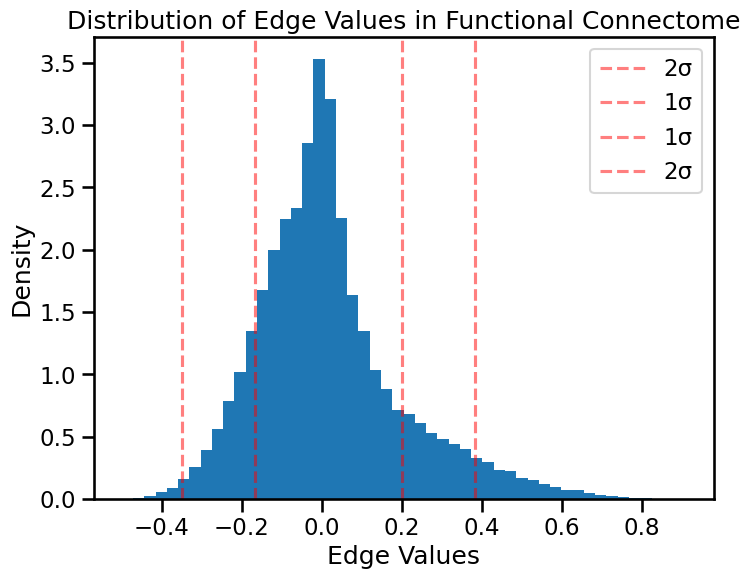

In [29]:
from data.data_load import load_transcriptome, load_connectome, load_coords, load_network_labels
from data.data_viz import plot_umap_embeddings_w_fc

### SMT POOL EMBEDDINGS ###
from models.smt import SharedSelfAttentionPoolingModel, SharedSelfAttentionCLSPoolingModel

# Load data
print("Loading data...")
X = load_transcriptome(parcellation='S456', hemisphere='both', omit_subcortical=False, sort_genes='refgenome', impute_strategy='mirror_interpolate')

### PCA ###
X_pca = load_transcriptome(parcellation='S456', run_PCA='95var', hemisphere='both', omit_subcortical=False, sort_genes='refgenome', impute_strategy='mirror_interpolate')
Y = load_connectome(parcellation='S456', hemisphere='both', omit_subcortical=False)
coords = load_coords(parcellation='S456', hemisphere='both', omit_subcortical=False)
labels, network_labels = load_network_labels(parcellation='S456', hemisphere='both', omit_subcortical=False)

# Find rows that are not all NaN - necessary for gene expression data with unsampled regions
valid_indices = ~np.isnan(X).all(axis=1)

# Subset all data using valid indices
X_valid = X[valid_indices]
X_pca = X_pca[valid_indices]
Y_valid = Y[valid_indices][:, valid_indices]
coords_valid = coords[valid_indices]
labels = [labels[i] for i in range(len(labels)) if valid_indices[i]]
network_labels = network_labels[valid_indices]

# Plot histogram of edge values
plt.figure(figsize=(8, 6))
plt.hist(Y.flatten(), bins=50, density=True)

# Add std dev markers
mean = np.mean(Y)
std = np.std(Y)
for i in [-2, -1, 1, 2]:
    plt.axvline(mean + i*std, color='r', linestyle='--', alpha=0.5, 
                label=f'{i}σ' if i > 0 else f'{abs(i)}σ')

plt.xlabel('Edge Values')
plt.ylabel('Density')
plt.title('Distribution of Edge Values in Functional Connectome')
plt.legend()
plt.show()

PCA and PLS

In [30]:
# Project X to PCs explaining 95% variance explained
print(f"X_pca shape: {X_pca.shape}")

### PLS ###
# Project X to 10 PLS components
pls_model = PLSRegression(n_components=10, max_iter=1000, scale=True)
pls_model.fit(X_valid, Y_valid)

# Use x_rotations_ for fixed projection like in PLSEncoder
X_pls = np.matmul(X_valid, pls_model.x_rotations_)
print(f"X_pls shape: {X_pls.shape}")

X_pca shape: (455, 27)
X_pls shape: (455, 10)


In [31]:
# prepare data loader
X = torch.tensor(X_valid, dtype=torch.float32).to("cuda") 
coords = torch.tensor(coords_valid, dtype=torch.float32).to("cuda")
dataset = TensorDataset(X, coords)
dataloader = DataLoader(dataset, batch_size=X_valid.shape[0], shuffle=False)

SMT

In [32]:
from models.smt import SharedSelfAttentionModel, SharedSelfAttentionCLSModel

# SMT EMBEDDINGS - 3 versions ###
smt_model_v1 = SharedSelfAttentionModel(input_dim=14760, token_encoder_dim=60, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=1024, aug_prob=0.3, epochs=110, num_workers=2, prefetch_factor=4)

smt_model_v2 = SharedSelfAttentionModel(input_dim=14760, token_encoder_dim=60, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=1024, aug_prob=0.3, epochs=110, num_workers=2, prefetch_factor=4)

smt_model_v3 = SharedSelfAttentionModel(input_dim=14760, token_encoder_dim=60, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=1024, aug_prob=0.3, epochs=110, num_workers=2, prefetch_factor=4)

# Load weights and prepare models
for i, model in enumerate([smt_model_v1, smt_model_v2, smt_model_v3], 1):
    model_path = f"/scratch/asr655/neuroinformatics/GeneEx2Conn/models/saved_models/UKBB_smt_full{i}.pt"
    model.load_state_dict(torch.load(model_path))
    model.eval()
    model.to("cuda")
    model.encoder.eval()

embeddings_smt_v1, embeddings_smt_v2, embeddings_smt_v3 = [], [], []
with torch.no_grad():
    for batch in dataloader:
        X, coords = batch
        embeddings_smt_v1 = smt_model_v1.encoder(batch[0]).cpu().numpy()
        embeddings_smt_v2 = smt_model_v2.encoder(batch[0]).cpu().numpy()
        embeddings_smt_v3 = smt_model_v3.encoder(batch[0]).cpu().numpy()

# SMT CLS EMBEDDINGS - 3 versions ###
smt_cls_model_v1 = SharedSelfAttentionCLSModel(input_dim=14760, token_encoder_dim=60, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=1024, aug_prob=0.0, epochs=110, num_workers=2, prefetch_factor=4,
                                          cls_init='spatial_learned')

smt_cls_model_v2 = SharedSelfAttentionCLSModel(input_dim=14760, token_encoder_dim=60, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=1024, aug_prob=0.0, epochs=110, num_workers=2, prefetch_factor=4,
                                          cls_init='spatial_learned')

smt_cls_model_v3 = SharedSelfAttentionCLSModel(input_dim=14760, token_encoder_dim=60, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=1024, aug_prob=0.0, epochs=110, num_workers=2, prefetch_factor=4,
                                          cls_init='spatial_learned')

# Load weights and prepare models
for i, model in enumerate([smt_cls_model_v1, smt_cls_model_v2, smt_cls_model_v3], 1):
    model_path = f"/scratch/asr655/neuroinformatics/GeneEx2Conn/models/saved_models/UKBB_smtcls_full{i}.pt"
    model.load_state_dict(torch.load(model_path))
    model.eval()
    model.to("cuda")
    model.encoder.eval()

embeddings_smt_cls_v1, embeddings_smt_cls_v2, embeddings_smt_cls_v3 = [], [], []
with torch.no_grad():
    for batch in dataloader:
        X, coords = batch
        embeddings_smt_cls_v1, _ = smt_cls_model_v1.encoder(X, coords, return_attn=True)
        embeddings_smt_cls_v1 = embeddings_smt_cls_v1.cpu().numpy()
        embeddings_smt_cls_v2, _ = smt_cls_model_v2.encoder(X, coords, return_attn=True)
        embeddings_smt_cls_v2 = embeddings_smt_cls_v2.cpu().numpy()
        embeddings_smt_cls_v3, _ = smt_cls_model_v3.encoder(X, coords, return_attn=True)
        embeddings_smt_cls_v3 = embeddings_smt_cls_v3.cpu().numpy()

  warnings.warn(



Number of learnable parameters in SMT model: 2162315
Number of learnable parameters in SMT model: 2162315
Number of learnable parameters in SMT model: 2162315


  warnings.warn(



Number of learnable parameters in SMT w/ CLS model: 2173067
Number of learnable parameters in SMT w/ CLS model: 2173067
Number of learnable parameters in SMT w/ CLS model: 2173067


In [33]:
smt_model = SharedSelfAttentionModel(input_dim=14760, token_encoder_dim=60, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=512, aug_prob=0.3, epochs=110, num_workers=2, prefetch_factor=4)

model_path = f"/scratch/asr655/neuroinformatics/GeneEx2Conn/models/saved_models/UKBB_smt_full_final.pt"
smt_model.load_state_dict(torch.load(model_path))  # Fixed: Changed model to smt_model
smt_model.eval()
smt_model.to("cuda")
smt_model.encoder.eval()

embeddings_smt = []
with torch.no_grad():
    for batch in dataloader:
        X, coords = batch
        embeddings_smt = smt_model.encoder(batch[0]).cpu().numpy()

  warnings.warn(



Number of learnable parameters in SMT model: 2162315


In [34]:
smt_compressed_model = SharedSelfAttentionModel(input_dim=14760, token_encoder_dim=60, encoder_output_dim=1, d_model=128,
                                          nhead=4, num_layers=4,
                                          deep_hidden_dims=[512, 256, 128], use_alibi=True, transformer_dropout=0.2,
                                          dropout_rate=0.2, learning_rate=0.00009, weight_decay=0.0001,
                                          batch_size=512, aug_prob=0.3, epochs=110, num_workers=2, prefetch_factor=4)

model_path = f"/scratch/asr655/neuroinformatics/GeneEx2Conn/models/saved_models/UKBB_smt_full_final_compressed.pt"
smt_compressed_model.load_state_dict(torch.load(model_path))
smt_compressed_model.eval()
smt_compressed_model.to("cuda")
smt_compressed_model.encoder.eval()

embeddings_smt_compressed = []
with torch.no_grad():
    for batch in dataloader:
        X, coords = batch
        embeddings_smt_compressed = smt_compressed_model.encoder(batch[0]).cpu().numpy()

  warnings.warn(



Number of learnable parameters in SMT model: 1027586


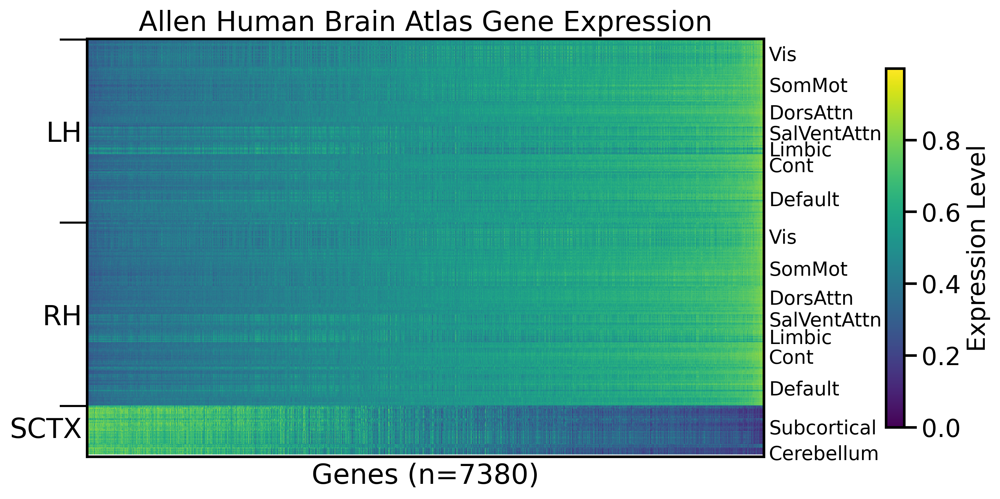

In [35]:
plot_transcriptome(parcellation='S456', gene_list='0.2', dataset='AHBA', run_PCA=None, 
                      omit_subcortical=False, hemisphere='both', impute_strategy='mirror_interpolate', 
                      sort_genes='expression', null_model='none', random_seed=42, 
                      cmap='viridis', title='Allen Human Brain Atlas Gene Expression', fontsize=20, 
                      add_hemisphere_labels=True, add_network_labels=True, jupyter=True)

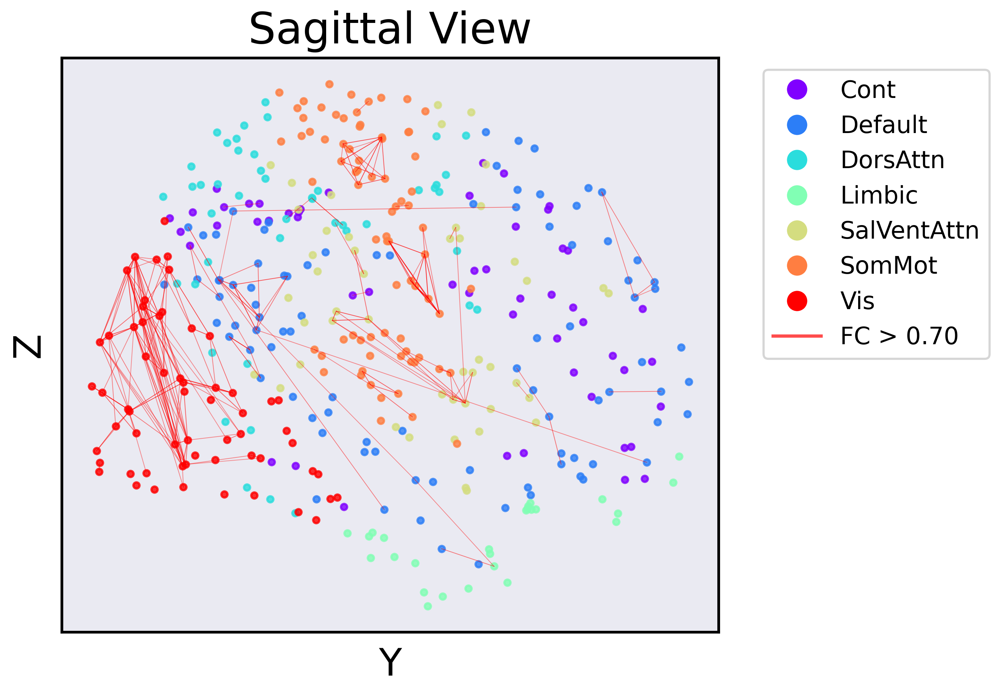

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



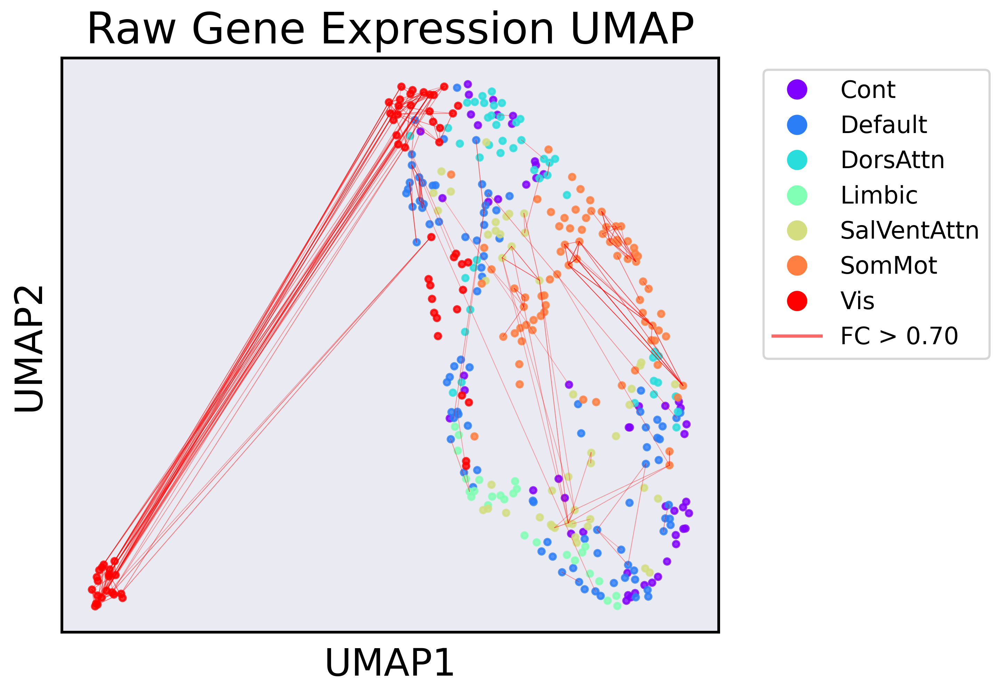

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



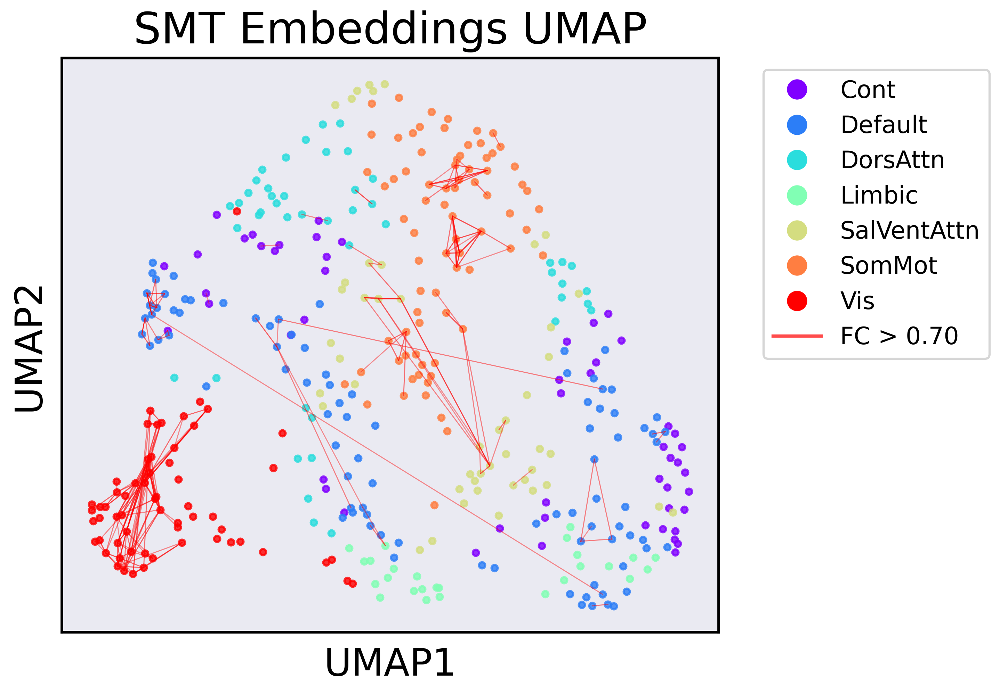

'\n# SMT embeddings \nplot_umap_embeddings_w_fc(embeddings_smt_compressed, network_labels, conn_matrix=Y_valid, \n                         edge_threshold=(neg_threshold, pos_threshold), \n                         title="SMT Compressed Embeddings UMAP", \n                         omit_subcortical=omit_subcortical, flip_umap1=True)\n\n# SMT v2 embeddings \nplot_umap_embeddings_w_fc(embeddings_smt_v2, network_labels, conn_matrix=Y_valid, \n                         edge_threshold=(neg_threshold, pos_threshold), \n                         title="SMT v2 Embeddings UMAP", \n                         omit_subcortical=omit_subcortical, flip_umap1=True, flip_umap2=True)\n'

In [85]:
from data.data_viz import plot_coords_w_fc, plot_umap_embeddings_w_fc

omit_subcortical = True
neg_threshold, pos_threshold = -0.7, 0.7

coords_np = coords.cpu().numpy()
plot_coords_w_fc(coords_np, network_labels, dims=(1,2), conn_matrix=Y_valid, 
                 edge_threshold=(neg_threshold, pos_threshold), 
                 title="Sagittal View",
                 omit_subcortical=omit_subcortical, edge_alpha=0.4, edge_width=0.5)

# Raw gene expression data
plot_umap_embeddings_w_fc(X_valid, network_labels, conn_matrix=Y_valid, 
                         edge_threshold=(neg_threshold, pos_threshold), 
                         title="Raw Gene Expression UMAP", 
                         omit_subcortical=omit_subcortical, edge_alpha=0.3, edge_width=0.5)

# SMT embeddings 
plot_umap_embeddings_w_fc(embeddings_smt, network_labels, conn_matrix=Y_valid, 
                         edge_threshold=(neg_threshold, pos_threshold), 
                         title="SMT Embeddings UMAP", 
                         omit_subcortical=omit_subcortical, flip_umap1=True, edge_alpha=0.4, edge_width=0.7)
'''
# SMT embeddings 
plot_umap_embeddings_w_fc(embeddings_smt_compressed, network_labels, conn_matrix=Y_valid, 
                         edge_threshold=(neg_threshold, pos_threshold), 
                         title="SMT Compressed Embeddings UMAP", 
                         omit_subcortical=omit_subcortical, flip_umap1=True)

# SMT v2 embeddings 
plot_umap_embeddings_w_fc(embeddings_smt_v2, network_labels, conn_matrix=Y_valid, 
                         edge_threshold=(neg_threshold, pos_threshold), 
                         title="SMT v2 Embeddings UMAP", 
                         omit_subcortical=omit_subcortical, flip_umap1=True, flip_umap2=True)
'''

In [82]:
# pc_values = X_pca[:, 2]
# plot_coords_w_fc(coords_np, network_labels, dims=(1,2), conn_matrix=Y_valid, pc_values=pc_values, 
#                  edge_threshold=(neg_threshold, pos_threshold), 
#                  title="Y-Z View",
#                  omit_subcortical=omit_subcortical)

# # Raw gene expression data
# plot_umap_embeddings_w_fc(X_valid, network_labels, conn_matrix=Y_valid, 
#                          edge_threshold=(neg_threshold, pos_threshold), 
#                          pc_values=pc_values,
#                          title="Raw Gene Expression UMAP",
#                          omit_subcortical=omit_subcortical, edge_alpha=0.2, edge_width=0.5)

# # SMT embeddings 
# plot_umap_embeddings_w_fc(embeddings_smt, network_labels, conn_matrix=Y_valid, 
#                          edge_threshold=(neg_threshold, pos_threshold), 
#                          pc_values=pc_values,
#                          title="SMT Embeddings UMAP", 
#                          omit_subcortical=omit_subcortical, flip_umap1=True,)

# # SMT compressed embeddings 
# plot_umap_embeddings_w_fc(embeddings_smt_compressed, network_labels, conn_matrix=Y_valid, 
#                          edge_threshold=(neg_threshold, pos_threshold), 
#                          pc_values=pc_values,
#                          title="SMT Compressed Embeddings UMAP", 
#                          omit_subcortical=omit_subcortical, flip_umap1=True)

# # SMT embeddings 
# plot_umap_embeddings_w_fc(embeddings_smt_v2, network_labels, conn_matrix=Y_valid, 
#                          edge_threshold=(neg_threshold, pos_threshold), 
#                          pc_values=pc_values,
#                          title="SMT v2 Embeddings UMAP", 
#                          omit_subcortical=omit_subcortical, flip_umap1=True, flip_umap2=True)


In [83]:
# Per subnetwork SMT > Bilinear gains
mean_gains = {
    'Vis': 0.088,
    'SomMot': 0.081, 
    'DorsAttn': 0.063,
    'SalVentAttn': 0.061,
    'Limbic': 0.044,
    'Cont': 0.054,
    'Default': 0.047,
    'Subcortical': 0.036,
    'Cerebellum': 0.058
}

intra_network_gains = {
    'Vis': 0.11,
    'SomMot': 0.11,
    'DorsAttn': 0.071,
    'SalVentAttn': 0.069,
    'Limbic': 0.035,
    'Cont': 0.057,
    'Default': 0.040,
    'Subcortical': 0.032,
    'Cerebellum': 0.035
}

inter_network_gains = {
    'Vis': 0.069,
    'SomMot': 0.056,
    'DorsAttn': 0.055,
    'SalVentAttn': 0.054,
    'Limbic': 0.054,
    'Cont': 0.051,
    'Default': 0.055,
    'Subcortical': 0.041,
    'Cerebellum': 0.082
}

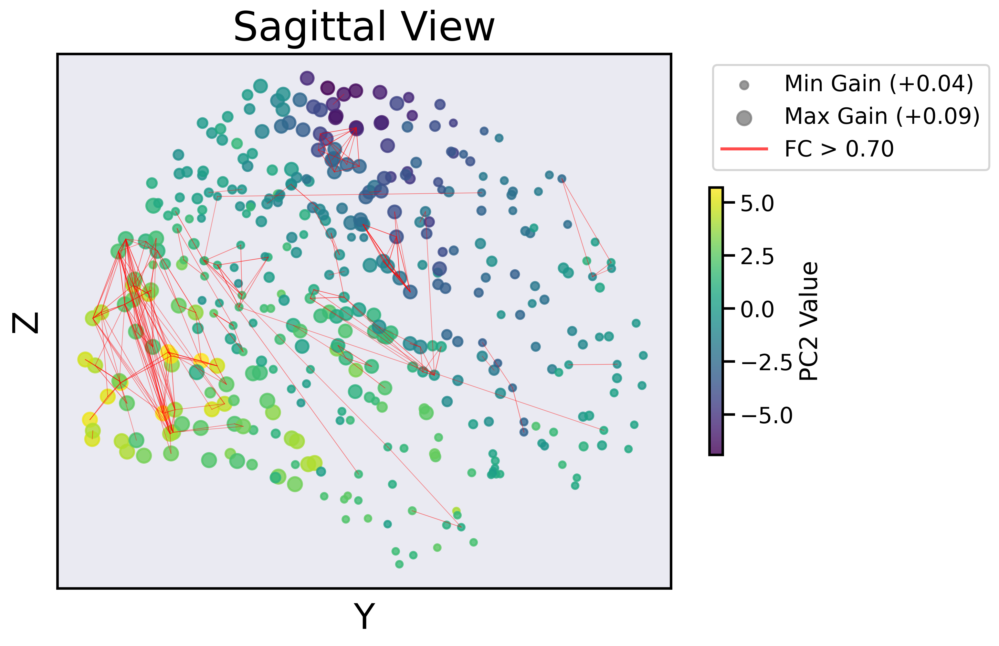

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



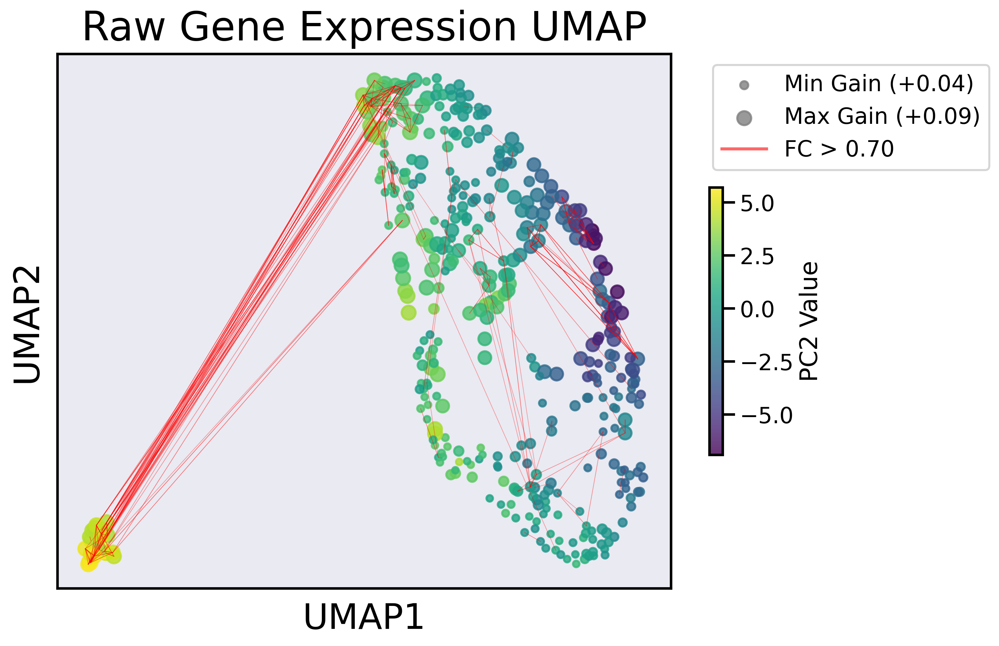

  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")



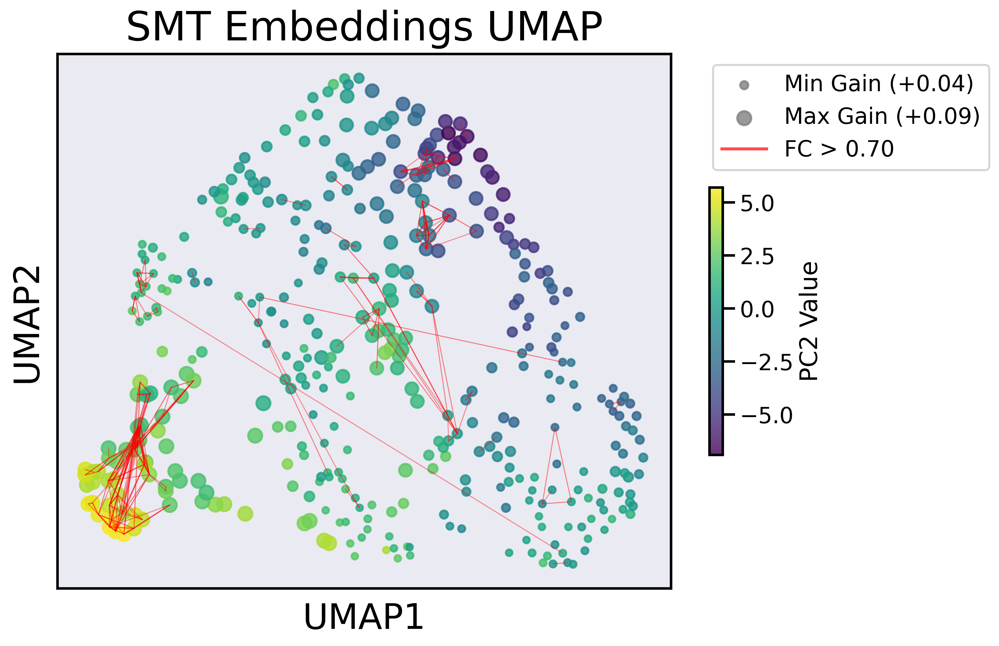

In [86]:
pc_values = X_pca[:, 2]
plot_coords_w_fc(coords_np, network_labels, dims=(1,2), conn_matrix=Y_valid, pc_values=pc_values, 
                 edge_threshold=(neg_threshold, pos_threshold), 
                 title="Sagittal View", figsize=(10.6,7),
                 omit_subcortical=omit_subcortical,
                 network_gains=mean_gains, edge_alpha=0.4, edge_width=0.5)

# Raw gene expression data
plot_umap_embeddings_w_fc(X_valid, network_labels, conn_matrix=Y_valid, 
                         edge_threshold=(neg_threshold, pos_threshold), 
                         pc_values=pc_values, figsize=(10.6,7),
                         title="Raw Gene Expression UMAP", 
                         omit_subcortical=omit_subcortical,
                         network_gains=mean_gains, edge_alpha=0.3, edge_width=0.5)

# SMT embeddings 
plot_umap_embeddings_w_fc(embeddings_smt, network_labels, conn_matrix=Y_valid, 
                         edge_threshold=(neg_threshold, pos_threshold), 
                         pc_values=pc_values, figsize=(10.6,7),
                         title="SMT Embeddings UMAP", 
                         omit_subcortical=omit_subcortical, flip_umap1=True,
                         network_gains=mean_gains, edge_alpha=0.4, edge_width=0.7)

# # SMT compressed embeddings 
# plot_umap_embeddings_w_fc(embeddings_smt_compressed, network_labels, conn_matrix=Y_valid, 
#                          edge_threshold=(neg_threshold, pos_threshold), 
#                          pc_values=pc_values, figsize=(10.5,7),
#                          title="SMT Compressed Embeddings UMAP", 
#                          omit_subcortical=omit_subcortical, flip_umap1=True,
#                          network_gains=mean_gains, edge_alpha=0.2, edge_width=0.8)

# # SMT v2 embeddings 
# plot_umap_embeddings_w_fc(embeddings_smt_v2, network_labels, conn_matrix=Y_valid, 
#                          edge_threshold=(neg_threshold, pos_threshold), 
#                          pc_values=pc_values, figsize=(10.5,7),
#                          title="SMT v2 Embeddings UMAP", 
#                          omit_subcortical=omit_subcortical, flip_umap1=True, flip_umap2=True,
#                          network_gains=mean_gains, edge_alpha=0.2, edge_width=0.8)


### Brain montage

In [92]:
from brainmontage import create_montage_figure, save_image


In [93]:
cortical_network_labels = network_labels[:400]


In [94]:
cortical_network_labels

array(['Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis',
       'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis',
       'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis', 'Vis',
       'Vis', 'Vis', 'Vis', 'Vis', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot', 'SomMot',
       'SomMot', 'SomMot', 'SomMot', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn', 'DorsAttn',
       'SalVentAttn', 'SalVentAttn', 'S

In [ ]:
network_colors = {
        'Frontoparietal (FPN)': '#D68E63',  # Darker Orange
        'Default mode (DMN)': '#D67A7A',     # Darker Red
        'Salience (SN)': '#55B755',          # Darker Green
        'Limbic (LN)': '#D6CC7A',            # Darker Yellow
        'Dorsal attention (DAN)': '#D67AD6',  # Darker Magenta
        'Somatosensory motor (SMN)': '#639CD6', # Darker Light Blue
        'Visual (VN)': '#7B3B7B'             # Darker Purple
    }

In [100]:
import os

# Set before any nilearn fetch calls
os.environ["NILEARN_DATA"] = "/scratch/asr655/neuroinformatics/GeneEx2Conn/data/nilearn_data"

from nilearn import datasets

In [102]:
import nilearn
print(os.getenv("NILEARN_DATA"))  # Should print your scratch path

/scratch/asr655/neuroinformatics/GeneEx2Conn/data/nilearn_data


In [103]:
import numpy as np
from brainmontage import create_montage_figure, save_image

#note: any ROIs with "nan" will not be displayed

roivals=np.arange(86)+1 #example values for each ROI (1-numroi)

img=create_montage_figure(roivals,atlasname='fs86',
    viewnames='all',surftype='infl',clim=[0,86],colormap='magma')

save_image(img,'mydata_montage.png')
#or you can add outputimagefile='mydata_montage.png' to create_montage_figure() to save directly

#create an image with surface views, upscaled by 2, a vertical row of axial slices, 
# with black background, using smoother "best" face-coloring mode
img_with_slices=create_montage_figure(roivals,atlasname='fs86',
    viewnames='all',surftype='infl',clim=[0,86],colormap='magma',
    slice_dict={'axial':[23,33,43,53]},mosaic_dict={'axial':[-1,1]},
    upscale_factor=2, backgroundcolor="black", face_mode="best",
    outputimagefile='mydata_montage_withslices.png')

#create an image with surface views, upscaled by 2, with a colorbar
img_with_slices=create_montage_figure(roivals,atlasname='fs86',
    viewnames='all',surftype='infl',clim=[0,86],colormap='magma',
    upscale_factor=2, face_mode="best", add_colorbar=True, colorbar_label='my data',
    outputimagefile='mydata_montage_withcolorbar.png')

#Or an image with axial, coronal, and sagittal slices only, and a light gray background
img_slices=create_montage_figure(roivals,atlasname='fs86',
    viewnames='none',clim=[0,86],colormap='rainbow',
    slice_dict={'axial':range(0,180,20),'coronal':range(20,200,20),'sagittal':range(10,180,20)},
    backgroundcolor="lightgray",
    outputimagefile='mydata_montage_onlyslices.png')

#Or use an existing cifti91k dlabel.nii file and supply parcel values to view
roivals=np.arange(1056)+1 #example for 4S1056 subparc
img_with_slices=create_montage_figure(roivals,atlasname='cifti91k',
    subparcfile='path/to/tpl-fsLR_atlas-4S1056Parcels_den-91k_dseg.dlabel.nii',
    viewnames='all',surftype='infl',clim=[0,1056],colormap='rainbow',
    slice_dict={'axial':[23,33,43,53]},mosaic_dict={'axial':[-1,1]},
    outputimagefile='mydata4S1056_montage_withslices.png')
    

OSError: Nilearn tried to store the dataset in the following directories, but: 
 -/ext3/miniconda3/lib/python3.11/site-packages/brainmontage/nilearn_data/fsaverage (Read-only file system)

In [98]:
import brainmontage
print(brainmontage.__file__)

/ext3/miniconda3/lib/python3.11/site-packages/brainmontage/__init__.py
